In [1]:
!mkdir hotels-50k
!wget -P hotels-50k https://github.com/GWUvision/Hotels-50K/raw/master/input/dataset.tar.gz
!tar -xvzf hotels-50k/dataset.tar.gz -C hotels-50k
!rm hotels-50k/dataset.tar.gz

mkdir: hotels-50k: File exists
--2023-09-11 17:28:15--  https://github.com/GWUvision/Hotels-50K/raw/master/input/dataset.tar.gz
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/GWUvision/Hotels-50K/master/input/dataset.tar.gz [following]
--2023-09-11 17:28:16--  https://raw.githubusercontent.com/GWUvision/Hotels-50K/master/input/dataset.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14353865 (14M) [application/octet-stream]
Saving to: ‘hotels-50k/dataset.tar.gz’

dataset.tar.gz      100%[===================>]  13.69M  10.9MB/s    in 1.3s    

2023-09-11 17:28:22 (10.9 MB/s) - ‘hotels-50k/

In [1]:
import pandas as pd
import tqdm

# chain_info eda

In [2]:
chain_df = pd.read_csv("./hotels-50k/dataset/chain_info.csv")
display(chain_df.head())

,chain_id,chain_name
0,-1,unknown
1,0,Best Western
2,1,Hyatt
3,2,Marriott
4,3,Hilton


In [3]:
print(f"Количество классов: {len(chain_df)}")
print(f"Количество уникальных классов: {len(chain_df['chain_name'].unique())}")

Количество классов: 93
Количество уникальных классов: 93


# hotel_info eda

In [4]:
hotel_df = pd.read_csv("./hotels-50k/dataset/hotel_info.csv")
display(hotel_df.head())

,hotel_id,hotel_name,chain_id,latitude,longitude
0,391,Extended Stay America - Fairbanks - Old Airpor...,72,64.83538,-147.82330
1,392,Hilton Hangzhou Qiandao Lake Resort,3,29.60819,119.07290
2,393,Taj Lands End,-1,19.04391,72.81879
3,395,Cambridge Suites Hotel Sydney,-1,46.13663,-60.19551
4,396,Tamanu Beach,14,-18.84213,-159.78794


In [5]:
print(f'Количество отелей: {len(hotel_df)}')
print(f'Количество уникальный отелей: {len(hotel_df["hotel_id"].unique())}')

Количество отелей: 50000
Количество уникальный отелей: 50000


In [6]:
count_hotels_in_franchise = hotel_df[["chain_id", "hotel_id"]].groupby(by='chain_id').count().rename(columns= {'hotel_id':'total_hotels'})
count_hotels_in_franchise.head()
# Посчитаем количество отелей в каждой франшизе

,total_hotels
chain_id,
-1,27519
0,998
1,381
2,571
3,404


In [7]:
total_hotels = count_hotels_in_franchise['total_hotels']

<Axes: ylabel='Frequency'>

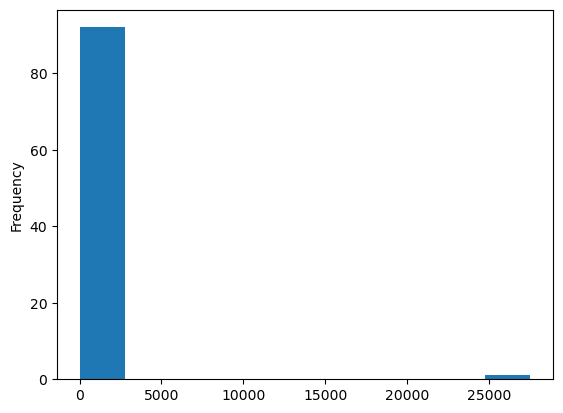

In [8]:
total_hotels.plot.hist()
# Ничего не понятно, надо убрать неизвестные отели, слишком много их.

In [9]:
count_hotels_in_franchise[count_hotels_in_franchise['total_hotels'] > 900]


,total_hotels
chain_id,
-1,27519
0,998
91,1394
92,2377


<Axes: ylabel='Frequency'>

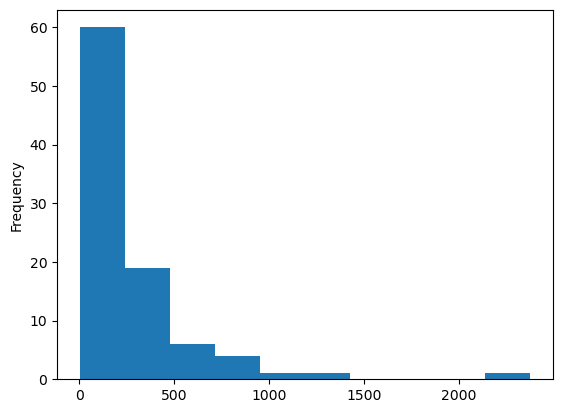

In [10]:
total_hotels[total_hotels < total_hotels.max()].plot.hist()
# Похоже на экспоненциальное.

In [11]:
from eda_lib.statistic_test import ks_test

ks_test(count_hotels_in_franchise['total_hotels'], dist='expon')


Тест Колмогорова-Смирнова:
Статистика теста: 0.9545104951351616
p-значение: 3.0674148450874977e-125
Данные не похожи на expon распределение.


<Axes: ylabel='Frequency'>

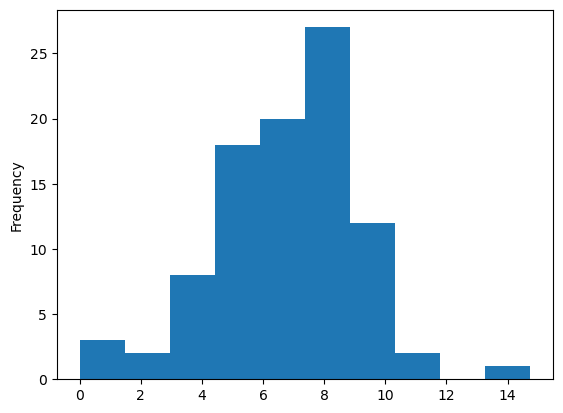

In [12]:
import numpy as np

np.log2(count_hotels_in_franchise['total_hotels']).plot.hist()
# опа, похоже на нормальное. Возможно исходное логнормальное

In [13]:
from eda_lib.statistic_test import shapiro_test

shapiro_test(np.log2(count_hotels_in_franchise['total_hotels']))

Тест Шапиро-Уилка:
Статистика теста: 0.9636009335517883
p-значение: 0.010786090046167374
Данные не похожи на нормальное распределение.


In [14]:
from eda_lib.statistic_test import anderson_test

anderson_test(np.log2(count_hotels_in_franchise['total_hotels']))


Тест Андерсона-Дарлинга:
Статистика теста: 0.7889051217361356
Критические значения: [0.554 0.631 0.757 0.883 1.05 ]
Данные не похожи на нормальное распределение.


In [15]:
from eda_lib.statistic_test import ks_test

ks_test(np.log2(count_hotels_in_franchise['total_hotels']))


Тест Колмогорова-Смирнова:
Статистика теста: 0.952119767866692
p-значение: 3.59385912134865e-123
Данные не похожи на norm распределение.


# Ну или не похоже :) Вцелом нам кажется особо без разницы, какое тут распределение. Главное что не равномерное. 

In [16]:
train_df = pd.read_csv('./hotels-50k/dataset/train_set.csv', header=None, 
                       names=['image_id', 'hotel_id', 'url', 'source', 'timestamp'])

display(train_df.head())

,image_id,hotel_id,url,source,timestamp
0,3485,18187,https://traffickcam.com/images/2016/10/2015090...,traffickcam,9/9/15 17:23
1,3486,18187,https://traffickcam.com/images/2016/10/2015090...,traffickcam,9/9/15 17:23
2,3663,73224,https://traffickcam.com/images/2016/10/2015091...,traffickcam,9/17/15 19:33
3,2586939,86350,https://traffickcam.com/images/2017/2/20160125...,traffickcam,1/25/16 19:12
4,2586950,1533,https://traffickcam.com/images/2017/2/20160125...,traffickcam,1/25/16 17:23


In [17]:
print(f"Количество обучающех примеров: {len(train_df)}")

Количество обучающех примеров: 1124215


In [18]:
total_images_in_hotel_id = train_df[['image_id', 'hotel_id']].groupby(by='hotel_id').count().rename(columns= {'image_id':'total_images'})
total_images_in_hotel_id

,total_images
hotel_id,
391,7
392,33
393,24
395,13
396,26
...,...
481233,15
481258,15
481261,15


<Axes: ylabel='Frequency'>

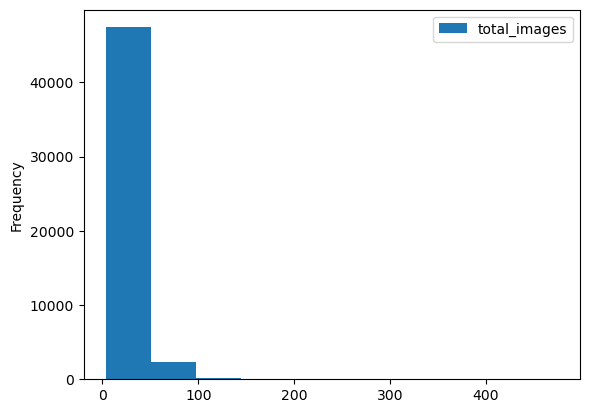

In [19]:
total_images_in_hotel_id.plot.hist()
# Распределение фотографий по отелям также не является равномерным.

<Axes: ylabel='Frequency'>

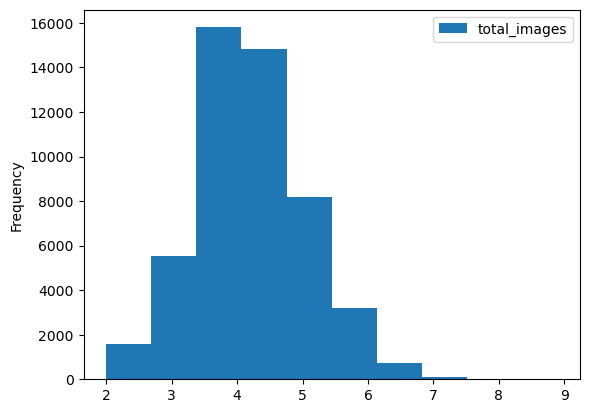

In [20]:
np.log2(total_images_in_hotel_id).plot.hist()
# В целом похоже на нормальное 

In [21]:
from eda_lib.statistic_test import shapiro_test

shapiro_test(np.log2(total_images_in_hotel_id))

Тест Шапиро-Уилка:
Статистика теста: 0.9908215403556824
p-значение: 0.0
Данные не похожи на нормальное распределение.


/Users/alexanderandreev/miniconda3/envs/tensorflow/lib/python3.10/site-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [22]:
from eda_lib.statistic_test import anderson_test

anderson_test(np.log2(count_hotels_in_franchise['total_hotels']))


Тест Андерсона-Дарлинга:
Статистика теста: 0.7889051217361356
Критические значения: [0.554 0.631 0.757 0.883 1.05 ]
Данные не похожи на нормальное распределение.


In [23]:
from eda_lib.statistic_test import ks_test

ks_test(np.log2(count_hotels_in_franchise['total_hotels']))


Тест Колмогорова-Смирнова:
Статистика теста: 0.952119767866692
p-значение: 3.59385912134865e-123
Данные не похожи на norm распределение.


### Вообще уверенно можно сказать что распределение неравномерное

In [24]:
test_df = pd.read_csv('./hotels-50k/dataset/test_set.csv', header=None, 
                       names=['image_id', 'hotel_id', 'url', 'source', 'timestamp'])

display(test_df.head())

,image_id,hotel_id,url,source,timestamp
0,image_id,hotel_id,image_url,image_source,upload_timestamp
1,2587571,79733,https://traffickcam.com/images/2017/4/20160304...,traffickcam,3/4/16 23:35
2,2587572,79733,https://traffickcam.com/images/2017/4/20160304...,traffickcam,3/4/16 23:35
3,2587573,79733,https://traffickcam.com/images/2017/4/20160304...,traffickcam,3/4/16 23:35
4,2587574,79733,https://traffickcam.com/images/2017/4/20160304...,traffickcam,3/4/16 23:35


In [25]:
print(f"Количество тестовых примеров: {len(test_df)}")

Количество тестовых примеров: 16172


In [26]:
count_hotels = 10
# Выберем 10 отелей

In [27]:
hotel_ids = list(total_images_in_hotel_id.sample(n=count_hotels).index)
hotel_ids

[88508, 39711, 84609, 28402, 25589, 113723, 53052, 12244, 23721, 6930]

In [28]:
from eda_lib.download_train import download_images

download_images(hotel_ids, "hotels-50k")

Good: ./images/train/77/39711/traffickcam/2633151.jpg
Good: ./images/train/-1/113723/traffickcam/2661698.jpg
Good: ./images/train/78/88508/traffickcam/3943622.jpg
Good: ./images/train/-1/6930/travel_website/7628730.jpg
Good: ./images/train/-1/6930/travel_website/7628738.jpg
Good: ./images/train/-1/12244/travel_website/8008156.jpg
Good: ./images/train/-1/12244/travel_website/8008164.jpg
Good: ./images/train/-1/12244/travel_website/8008172.jpg
Good: ./images/train/-1/23721/travel_website/6351411.jpg
Good: ./images/train/-1/23721/travel_website/6351419.jpg
Good: ./images/train/-1/23721/travel_website/6351427.jpg
Good: ./images/train/-1/23721/travel_website/6351435.jpg
Good: ./images/train/-1/23721/travel_website/6351443.jpg
Good: ./images/train/-1/25589/travel_website/7005089.jpg
Good: ./images/train/-1/25589/travel_website/7005097.jpg
Good: ./images/train/-1/25589/travel_website/7005105.jpg
Bad: ./images/train/86/28402/travel_website/7056181.jpg - HTTP Error 404: Not Found. https://i.tra

некоторые url протухли.

In [29]:
from eda_lib.walker import get_image_sizes

shapes = get_image_sizes("images")
shapes[:5]

[{'file_path': 'images/train/-1/25589/travel_website/7005096.jpg',
  'width': 640,
  'height': 417},
 {'file_path': 'images/train/-1/25589/travel_website/7005097.jpg',
  'width': 640,
  'height': 417},
 {'file_path': 'images/train/-1/25589/travel_website/7005095.jpg',
  'width': 640,
  'height': 417},
 {'file_path': 'images/train/-1/25589/travel_website/7005094.jpg',
  'width': 640,
  'height': 417},
 {'file_path': 'images/train/-1/25589/travel_website/7005090.jpg',
  'width': 640,
  'height': 417}]

In [30]:
unique_size = set([(shape['width'], shape['height']) for shape in shapes])
unique_size

{(424, 640),
 (426, 640),
 (428, 640),
 (477, 640),
 (479, 640),
 (480, 640),
 (481, 640),
 (640, 247),
 (640, 280),
 (640, 300),
 (640, 304),
 (640, 311),
 (640, 360),
 (640, 406),
 (640, 410),
 (640, 413),
 (640, 417),
 (640, 419),
 (640, 421),
 (640, 422),
 (640, 424),
 (640, 426),
 (640, 428),
 (640, 430),
 (640, 435),
 (640, 479),
 (640, 480),
 (640, 481),
 (640, 512),
 (640, 640)}

In [31]:
print(f'Количество уникальных размеров {len(unique_size)}. Всего фото {len(shapes)}')

Количество уникальных размеров 30. Всего фото 227


In [1]:
hotel_features = [
    "beds",
    "toilet",
    "towel",
    "robe",
    "bathroom",
    "shower",
    "balcony",
    "сurtains",
    "blackout curtains",
    "mirror",
    "televisor",
    "minibar",
    "safe",
    "coffee/Tea Facilities",
    "swimming Pool",
    "ironing Facilities",
    "air Conditioning",
    "heating",
    "table",
    "сhair",
    "telephone"
]
# список тегов

In [5]:
from eda_lib.clip_model import ClipModel

model = ClipModel()
model.load_hotel_tags(hotel_features)
print(model.get_tags("images/train/77/39711/travel_website/6040157.jpg"))

All model checkpoint layers were used when initializing TFCLIPModel.

All the layers of TFCLIPModel were initialized from the model checkpoint at openai/clip-vit-base-patch32.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFCLIPModel for predictions without further training.


[(0.26229915, 'beds'), (0.24468184, 'air Conditioning'), (0.24127358, 'minibar'), (0.23074463, 'towel'), (0.22277756, 'blackout curtains'), (0.22171563, 'robe'), (0.21745908, 'ironing Facilities'), (0.21446016, 'heating'), (0.20815773, 'televisor'), (0.20758787, 'balcony')]


In [6]:
from eda_lib.walker import get_images_tags

images2tags = get_images_tags("images", model)

images2tags[:5]

0it [00:00, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


32it [00:25,  1.25it/s]


[{'file_name': '7005096.jpg',
  'source': 'travel_website',
  'hotel_id': 25589,
  'chain_id': -1,
  'file_path': 'images/train/-1/25589/travel_website/7005096.jpg',
  'tags': [(0.2631925, 'beds'),
   (0.25292325, 'minibar'),
   (0.2367218, 'bathroom'),
   (0.23578675, 'blackout curtains'),
   (0.23401149, 'ironing Facilities'),
   (0.22821784, 'towel'),
   (0.22509314, 'air Conditioning'),
   (0.22503366, 'shower'),
   (0.21505083, 'mirror'),
   (0.21446018, 'сhair')]},
 {'file_name': '7005097.jpg',
  'source': 'travel_website',
  'hotel_id': 25589,
  'chain_id': -1,
  'file_path': 'images/train/-1/25589/travel_website/7005097.jpg',
  'tags': [(0.26047486, 'beds'),
   (0.25469732, 'minibar'),
   (0.24257335, 'bathroom'),
   (0.2313644, 'towel'),
   (0.22564386, 'blackout curtains'),
   (0.2254916, 'ironing Facilities'),
   (0.22355634, 'shower'),
   (0.22051305, 'robe'),
   (0.2188362, 'air Conditioning'),
   (0.21730787, 'toilet')]},
 {'file_name': '7005095.jpg',
  'source': 'travel_

In [7]:
hotel_id_to_filtered_tags = dict()
images_to_filtered_tags = dict()
for image2tag in images2tags:
    lowerboun = 0.25
    filter_tags = list(filter(lambda tag: tag[0] > lowerboun, image2tag['tags']))

    if len(filter_tags) == 0:
        filter_tags = [image2tag['tags'][0]]
    
    assert image2tag['file_name'] not in images_to_filtered_tags
    
    images_to_filtered_tags[image2tag['file_name']] = filter_tags
    
    only_tags = map(lambda entry: entry[1], filter_tags)
    
    if image2tag['hotel_id'] in hotel_id_to_filtered_tags:
        hotel_id_to_filtered_tags[image2tag['hotel_id']].update(set(only_tags))
    else:
        hotel_id_to_filtered_tags[image2tag['hotel_id']] = set(only_tags)


In [8]:
images_to_filtered_tags

{'7005096.jpg': [(0.2631925, 'beds'), (0.25292325, 'minibar')],
 '7005097.jpg': [(0.26047486, 'beds'), (0.25469732, 'minibar')],
 '7005095.jpg': [(0.25673005, 'beds')],
 '7005094.jpg': [(0.2574843, 'beds'), (0.25401664, 'minibar')],
 '7005090.jpg': [(0.24756221, 'beds')],
 '7005091.jpg': [(0.26876834, 'minibar'),
  (0.2679413, 'beds'),
  (0.25073352, 'bathroom')],
 '7005093.jpg': [(0.27891052, 'bathroom'),
  (0.25259164, 'minibar'),
  (0.25018618, 'shower')],
 '7005092.jpg': [(0.2539178, 'beds')],
 '7005100.jpg': [(0.2892444, 'bathroom'), (0.2801407, 'shower')],
 '7005101.jpg': [(0.28346625, 'bathroom'),
  (0.27119112, 'ironing Facilities'),
  (0.2664976, 'shower'),
  (0.26004228, 'toilet'),
  (0.25194737, 'minibar')],
 '7005103.jpg': [(0.2775668, 'bathroom'),
  (0.26476872, 'shower'),
  (0.25460073, 'mirror'),
  (0.25164306, 'minibar')],
 '7005089.jpg': [(0.24934483, 'minibar')],
 '7005102.jpg': [(0.27602124, 'bathroom'),
  (0.2692319, 'ironing Facilities'),
  (0.26180732, 'shower'),


In [9]:
from statistics import mean 
print(f"Cреднее количество тегов для одной фотки: {mean(map(lambda entry: len(entry[1]), images_to_filtered_tags.items()))}")

Cреднее количество тегов для одной фотки: 2.140969162995595


In [10]:
from statistics import mean 
print(f"Cреднее косинус у топ 1 фотки: {mean(map(lambda entry: entry[1][0][0], images_to_filtered_tags.items()))}")

Cреднее косинус у топ 1 фотки: 0.2681267261505127


In [11]:
print(f"Cреднее разница косинусов между 1 и 10 тегом: {mean(map(lambda info: info['tags'][0][0] - info['tags'][9][0], images2tags))}")

Cреднее разница косинусов между 1 и 10 тегом: 0.05577752739191055


In [12]:
hotel_id_to_filtered_tags

{25589: {'balcony',
  'bathroom',
  'beds',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'mirror',
  'shower',
  'toilet',
  'towel',
  'сhair',
  'сurtains'},
 6930: {'bathroom',
  'beds',
  'blackout curtains',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'robe',
  'shower',
  'toilet',
  'towel'},
 113723: {'bathroom',
  'beds',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'safe',
  'shower',
  'swimming Pool',
  'table',
  'toilet',
  'towel',
  'сhair'},
 23721: {'balcony',
  'bathroom',
  'beds',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'mirror',
  'shower',
  'table',
  'toilet',
  'towel',
  'сurtains'},
 12244: {'bathroom',
  'beds',
  'heating',
  'ironing Facilities',
  'minibar',
  'shower',
  'toilet'},
 53052: {'air Conditioning',
  'balcony',
  'bathroom',
  'beds',
  'blackout curtains',
  'coffee/Tea Facilities',
  'heating',
  'ironing Facilities',
  'minibar',
  'mirror',
  'safe'

In [13]:
print(f"Cреднее количество тегов у отеля: {mean(map(lambda entry: len(entry[1]), hotel_id_to_filtered_tags.items()))}")

Cреднее количество тегов у отеля: 12.2


In [14]:
print(f"Максимальное количество тегов у отеля: {max(map(lambda entry: len(entry[1]), hotel_id_to_filtered_tags.items()))}")

Максимальное количество тегов у отеля: 18


In [15]:
print(f"Минимальное количество тегов у отеля: {min(map(lambda entry: len(entry[1]), hotel_id_to_filtered_tags.items()))}")

Минимальное количество тегов у отеля: 7


### Кластеризация

In [16]:
from kmodes.kmodes import KModes
import pandas as pd

In [18]:
hotel_id_to_filtered_tags

{25589: {'balcony',
  'bathroom',
  'beds',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'mirror',
  'shower',
  'toilet',
  'towel',
  'сhair',
  'сurtains'},
 6930: {'bathroom',
  'beds',
  'blackout curtains',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'robe',
  'shower',
  'toilet',
  'towel'},
 113723: {'bathroom',
  'beds',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'safe',
  'shower',
  'swimming Pool',
  'table',
  'toilet',
  'towel',
  'сhair'},
 23721: {'balcony',
  'bathroom',
  'beds',
  'coffee/Tea Facilities',
  'ironing Facilities',
  'minibar',
  'mirror',
  'shower',
  'table',
  'toilet',
  'towel',
  'сurtains'},
 12244: {'bathroom',
  'beds',
  'heating',
  'ironing Facilities',
  'minibar',
  'shower',
  'toilet'},
 53052: {'air Conditioning',
  'balcony',
  'bathroom',
  'beds',
  'blackout curtains',
  'coffee/Tea Facilities',
  'heating',
  'ironing Facilities',
  'minibar',
  'mirror',
  'safe'

In [26]:
data = {tag: [] for tag in hotel_features}
for image_id, pair in images_to_filtered_tags.items():
    tags = list(map(lambda p: p[1], pair))
    for tag in hotel_features:
        data[tag].append(tag in tags)      
df = pd.DataFrame(data, index=images_to_filtered_tags.keys())
df.head()

,beds,toilet,towel,robe,bathroom,shower,balcony,сurtains,blackout curtains,mirror,...,minibar,safe,coffee/Tea Facilities,swimming Pool,ironing Facilities,air Conditioning,heating,table,сhair,telephone
7005096.jpg,True,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
7005097.jpg,True,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
7005095.jpg,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7005094.jpg,True,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
7005090.jpg,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 477.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 477.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 477.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 477.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 477.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 105, cost: 368.0
Run 1, iteration: 2/100, moves: 22, cost: 368.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 45, cost: 310.0
Run 2, iteration: 2/100, moves: 12, co

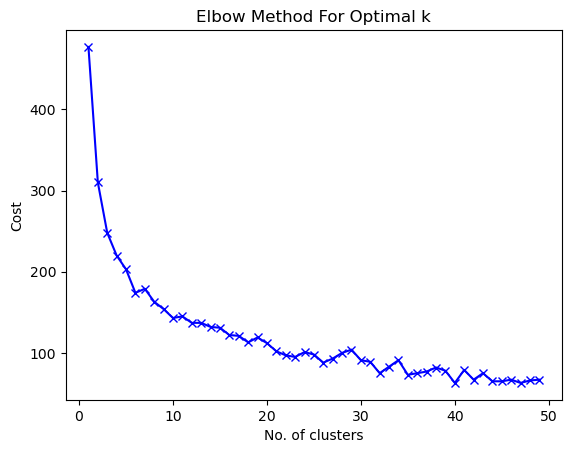

In [25]:
from matplotlib import pyplot as plt

cost = []
K = range(1,50)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(df)
    cost.append(kmode.cost_)
    
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

Если бы вы не знали заранее, сколько классов следует использовать, то выбрал бы значение k из диапазона (25 - 30). Как правило, процесс выбора оптимального k является эвристическим. Это означает, что нет однозначного математического метода для определения правильного значения k, и выбор зависит от анализа результатов. 
Да, всего клссов у нас 10. Вполне вероятно, такая ошибка связана с тем, что очень мало классов. 

#### Диффузионной модели

In [22]:
imgs = ["3943621.jpg", "7437599.jpg", "7437608.jpg", "2621918.jpg", "8008157.jpg"]

In [23]:
from eda_lib.walker import get_images

images = get_images("images", imgs)
images[0]

32it [00:00, 2393.07it/s]


{'file_name': '8008157.jpg',
 'source': 'travel_website',
 'hotel_id': 12244,
 'chain_id': -1,
 'file_path': 'images/train/-1/12244/travel_website/8008157.jpg',
 'width': 640,
 'height': 426}

In [34]:
from PIL import Image
from matplotlib import pyplot as plt

def print_image(images):
    for img_info in images:
        display(Image.open(img_info['file_path']))

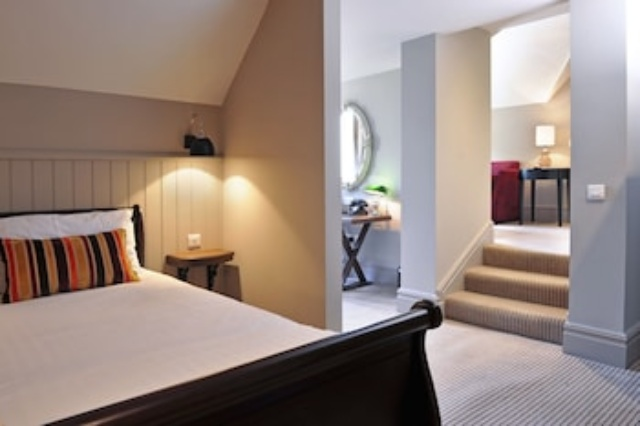

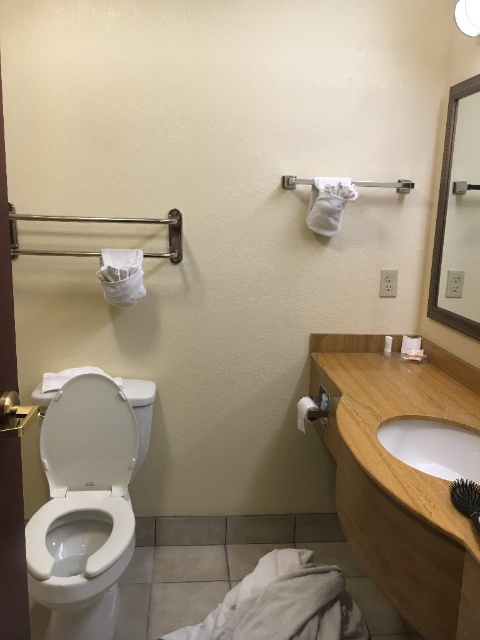

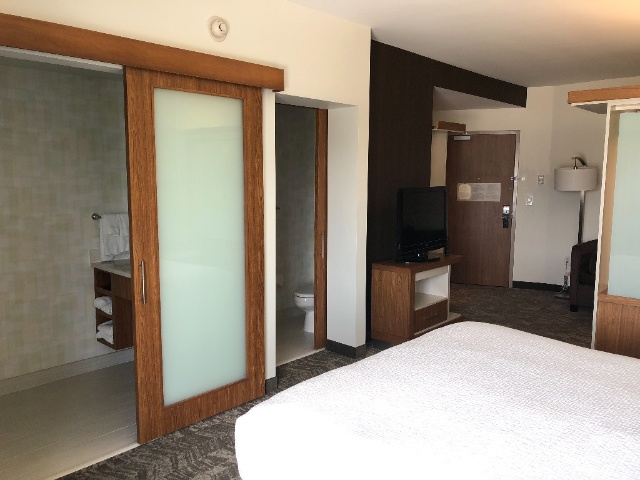

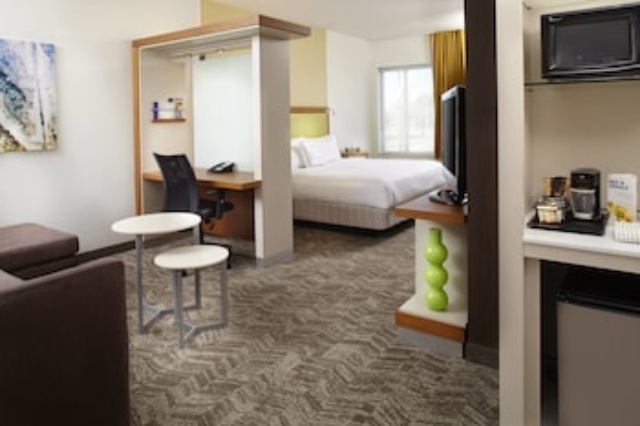

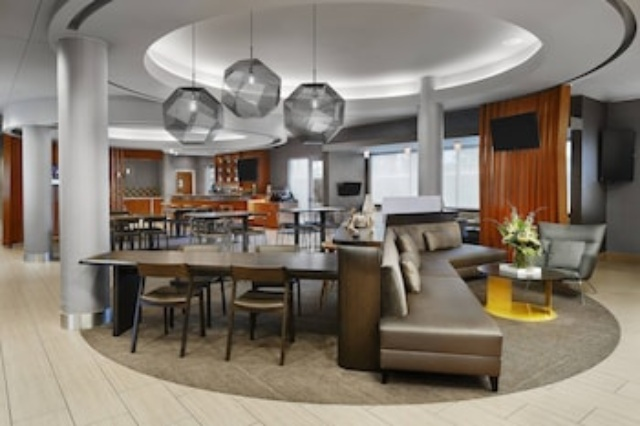

In [35]:
print_image(images)

In [36]:
def run_stage(images, change_info):
    new_images = []
    for image in images:
       new_images.append(img2img(api, change_info['promt'], change_info['steps'], change_info['denoising_strength'], image))
        
    return new_images

In [37]:
api = "http://127.0.0.1:7862"

In [38]:
add_snow = {
    "promt": "snow",
    "steps": 50,
    "denoising_strength": 0.4
}

In [39]:
from eda_lib.stable_diffusion_webui_api import img2img

images_with_snow = run_stage(images, add_snow)

8008157.jpgsVJYWVhnwVGqpxfFeasQGstg
2621918.jpgSPdqPtQblwYJwPbv
3943621.jpgurjwQUIhtClrvkPTpifnBN
7437599.jpgHIQtCHguDABmArgKOZVxHSFWo
7437608.jpgThsKWlAcokpZsMIwZUitgvOrk


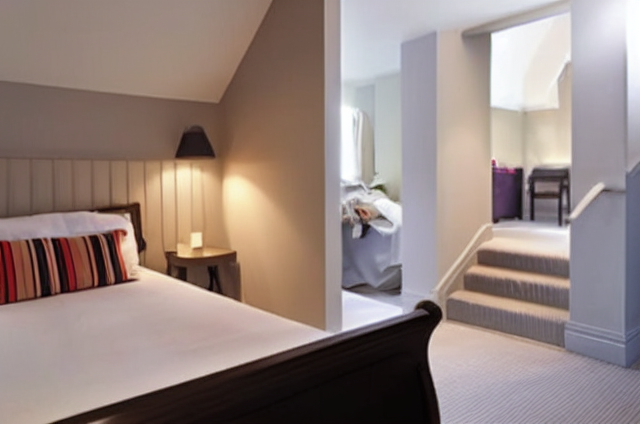

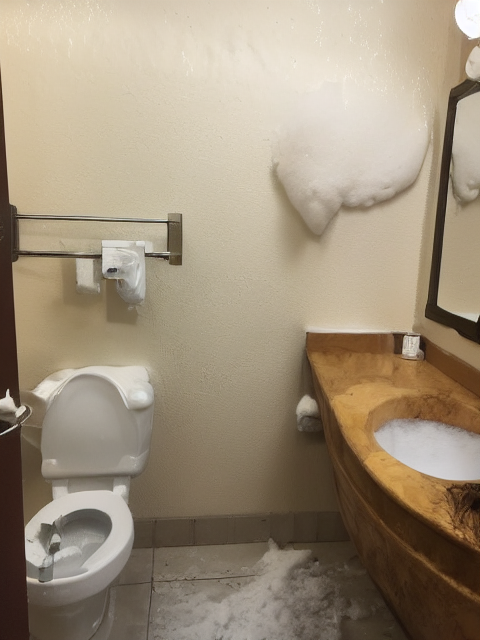

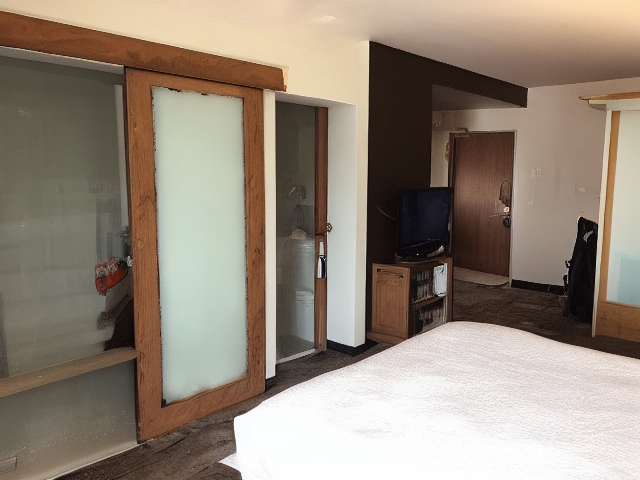

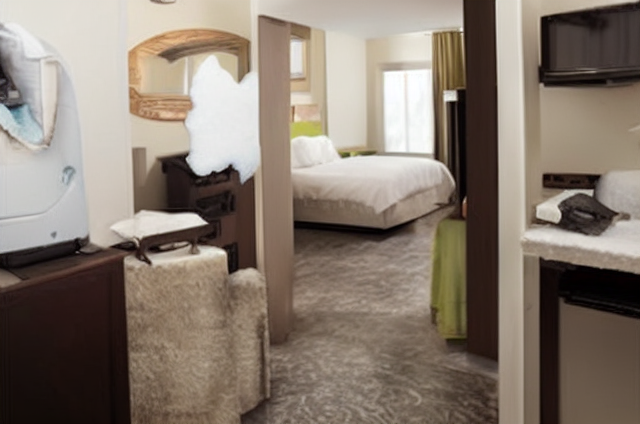

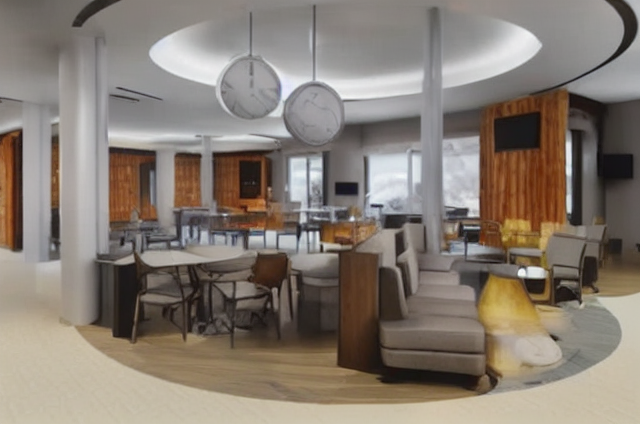

In [40]:
print_image(images_with_snow)

In [41]:
add_space = {
    "promt": "space",
    "steps": 40,
    "denoising_strength": 0.5
}

In [42]:
images_with_snow_and_space = run_stage(images_with_snow, add_space)

8008157.jpgOBCafLVLRMBcgYX
2621918.jpgVEzclBGdfhaubHMsA
3943621.jpgkLvYetScMchJFIZ
7437599.jpgBiZNmgdTtQOuZVVfpLbYNmwW
7437608.jpgiCERUYqNVTDAuCKwdEv


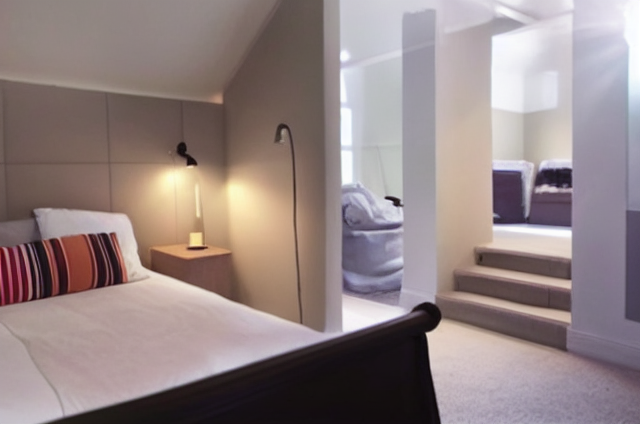

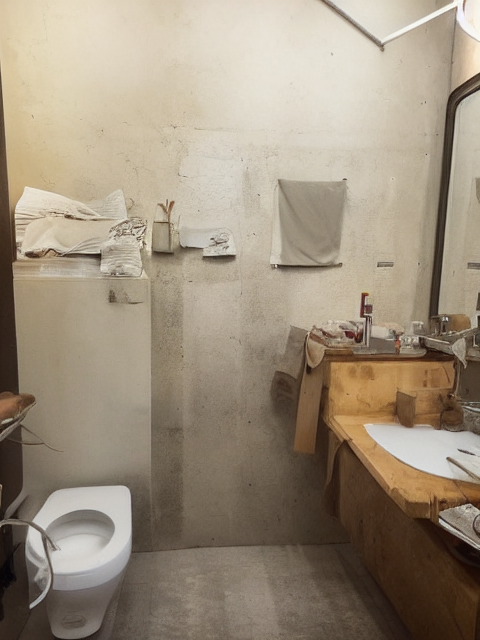

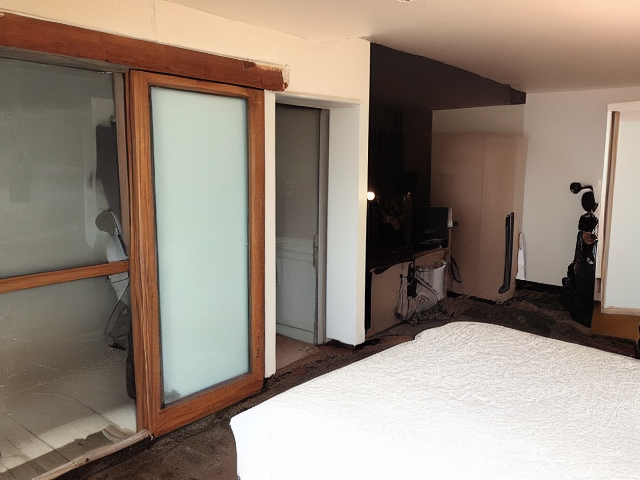

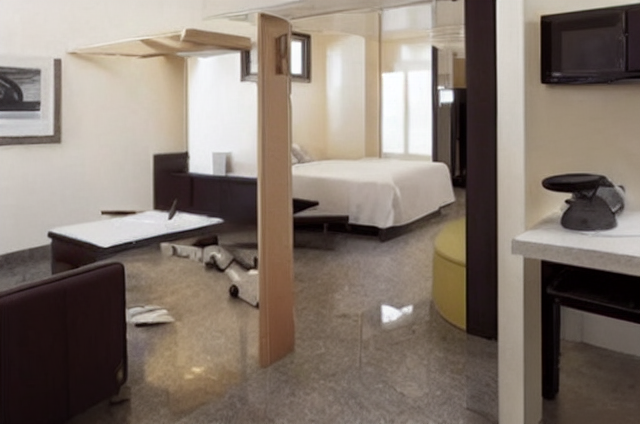

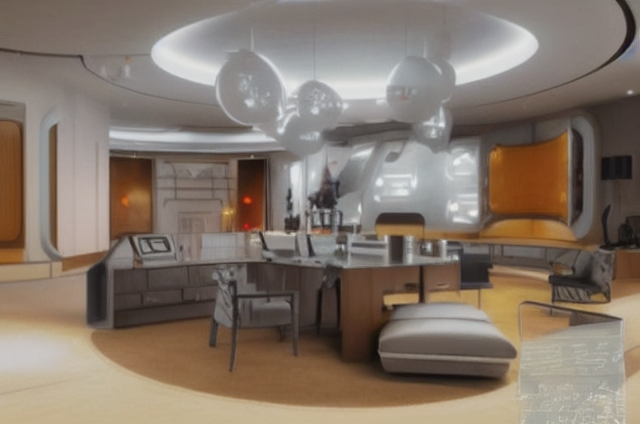

In [43]:
print_image(images_with_snow_and_space)
# Заюавно снег пропал :( Ну как так

In [44]:
add_art = {
    "promt": "impressionism, surrealism",
    "steps": 35,
    "denoising_strength": 0.4
}

In [45]:
images_with_snow_and_space_and_art = run_stage(images_with_snow_and_space, add_art)

8008157.jpgFvhiMEcuEwYsYcjtlJWi
2621918.jpgiICCekecDRXZAKZkGdHn
3943621.jpgkabEVpBvLAtAYkgAAaBwHaUwv
7437599.jpgCVVOFPgunCDizPBCwsfHA
7437608.jpgAdlNEMJNmCoLlIvlrQP


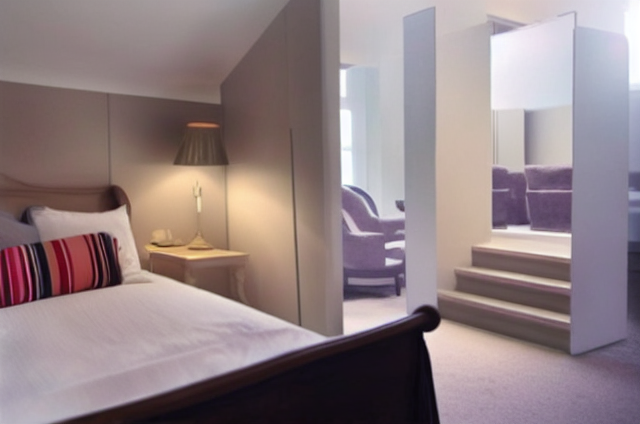

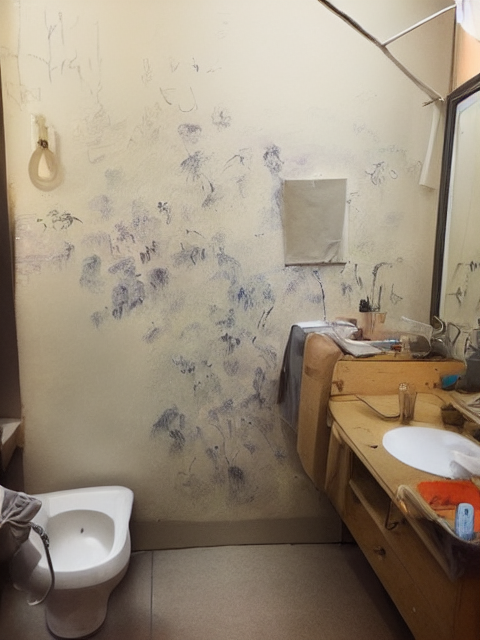

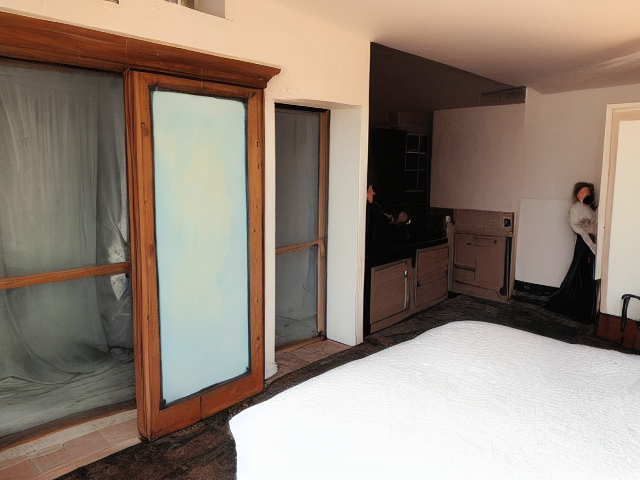

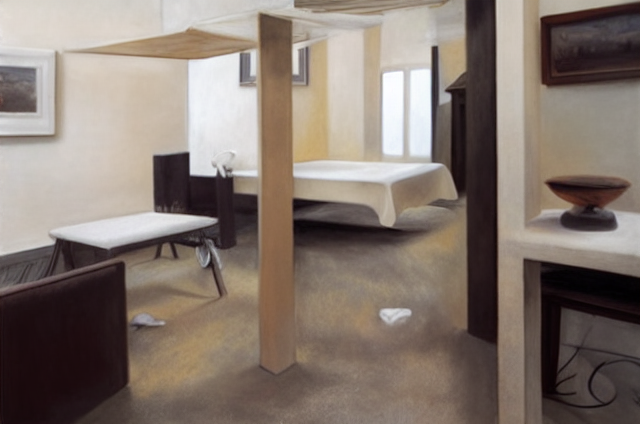

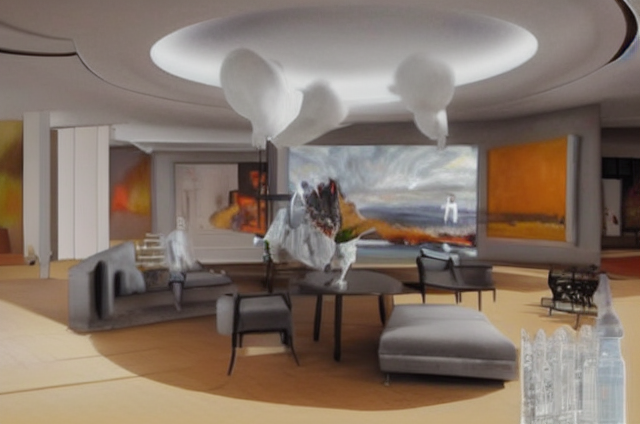

In [46]:
print_image(images_with_snow_and_space_and_art)